In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

## 8.3 Визуализация

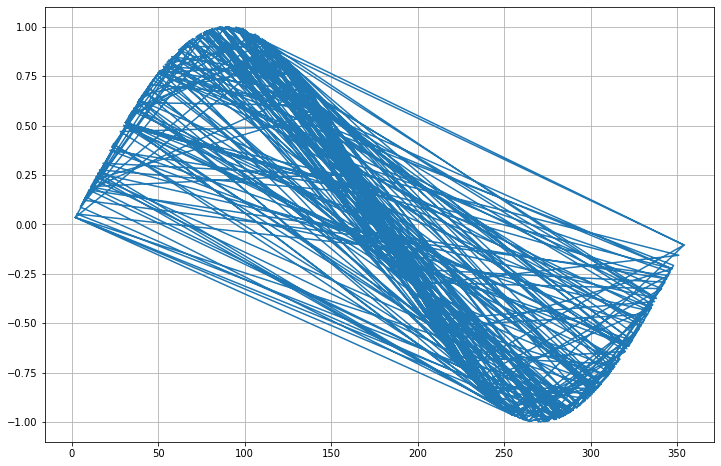

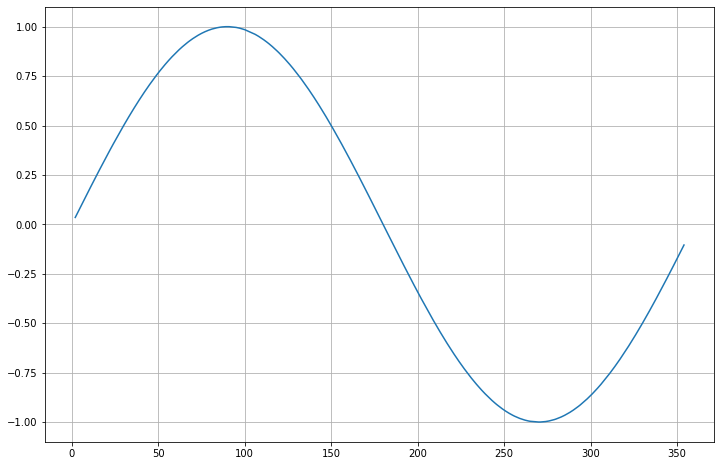

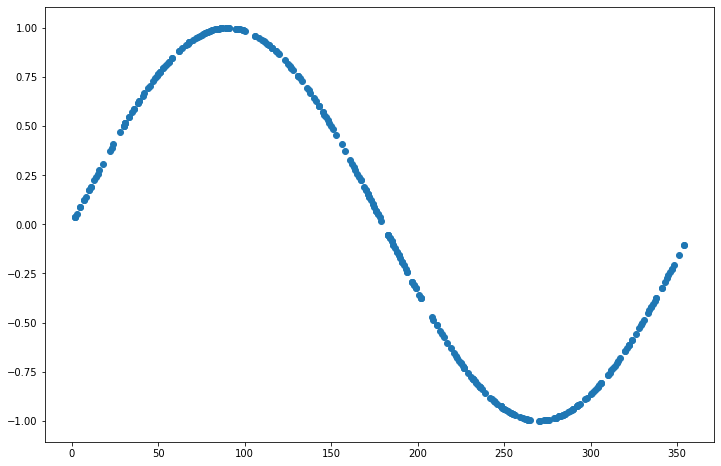

In [18]:
# иллюстрация того, что ряд нужно сортировать по времени либо использовать scatter
N = 360
df = pd.DataFrame()
# создаем 360 случайных точек по времени
df['t'] = np.random.randint(low=1, high=N, size=N)
df['y'] = np.sin(df['t'] * np.pi / 180) # строим синус на этих точках
# визуализация без сортировки
f, ax = plt.subplots(figsize = (12, 8))
ax.plot(df.t, df.y)
ax.grid()
plt.show()
# визуализация с сортировкой
df_sort = df.sort_values(by='t')
f, ax = plt.subplots(figsize = (12, 8))
ax.plot(df_sort.t, df_sort.y)
ax.grid()
plt.show()
# life hack: scatter
f, ax = plt.subplots(figsize=(12,8))
ax.scatter(df.t, df.y)
plt.show()


## 8.4. Способы визуализации в Python

Самое простое - встроенный plot. Его можно использовать для быстрого просмотра, но часто графики некрасивые и мало контроля

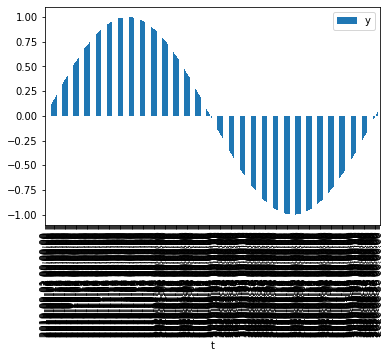

In [65]:
df = pd.DataFrame()
## создаем 365 дат с частотой 1 день
df['t'] = pd.date_range(start= '2019-09-01 ', periods=365, freq= 'D')
df['y'] = np.sin(df.index * np.pi / 180)
df.plot(x='t', y='y', kind = 'bar') # получилось некрасиво: все даты слились

Matplotlib - дает больше контроля

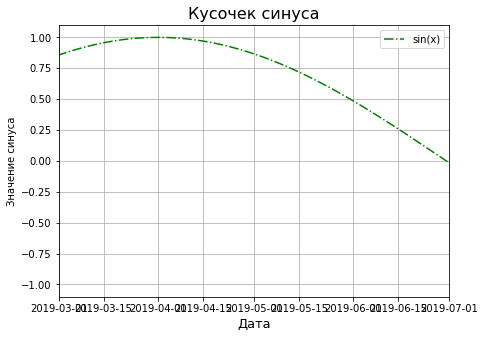

In [53]:
f = plt.figure(figsize=(7,5))
plt.plot(df.t, df.y, ls = '-.', c='g')
plt.xlim([pd.to_datetime('2019-03'), pd.to_datetime('2019-07')])
plt.legend(['sin(x)'])
plt.title('Кусочек синуса', fontsize = 16)
plt.ylabel('Значение синуса')
plt.xlabel('Дата', fontsize=13)
plt.grid()
plt.show()
# TODO: разобраться, как управлять осью х: все равно накладываются подписи времени

Пример двух графиков

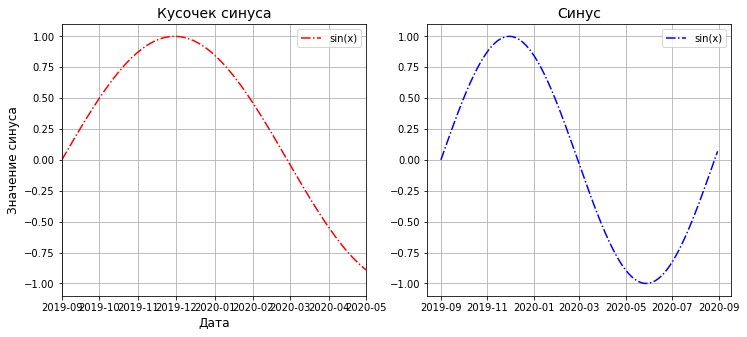

In [75]:
f, ax = plt.subplots(1, 2, figsize = (12, 5))
ax[0].plot(df.t, df.y, ls='-.', c='r')
ax[0].set_xlim([pd.to_datetime('2019-09-01'), pd.to_datetime('2020-05')])
ax[0].legend(['sin(x)'])
ax[0].set_title('Кусочек синуса', fontsize=14)
ax[0].set_xlabel('Дата', fontsize=12)
ax[0].set_ylabel('Значение синуса', fontsize=12)
ax[0].grid()

ax[1].plot(df.t, df.y, ls='-.', c='b')
ax[1].legend(['sin(x)'])
ax[1].set_title('Cинус', fontsize=14)
ax[1].grid()

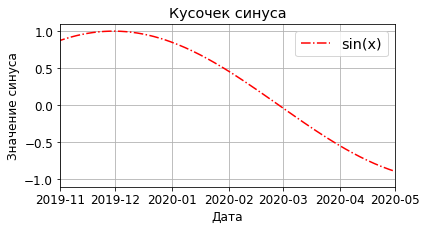

In [79]:
## глобальные настройки графиков
plt.rcParams['figure.figsize'] = [6.0, 3.0]
plt.rcParams['font.size'] = 12
plt.rcParams['legend.fontsize'] = 'large'
plt.rcParams['figure.titlesize'] = 'medium'

f, ax = plt.subplots()                                
ax.plot(df.t, df.y, ls='-.', c='r')                                
ax.set_xlim([pd.to_datetime('2019-11-01'), pd.to_datetime('2020-05')])                              
ax.legend(['sin(x)'])                                              
ax.set_title('Кусочек синуса')                         
ax.set_xlabel('Дата')                                  
ax.set_ylabel('Значение синуса')                     
ax.grid()                                                           


## Визуализация при помощи plotly

In [80]:
import plotly.graph_objects as go 

## создаём фигуру и добавляем в неё график
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.t, y=df.y, mode='lines'))
fig.show()

## Визуализация финансовых данных

Встроенный метод Plotly — Candlestick() — рисует японские свечи и автоматически добавляет ползунок под график для скроллинга.

In [85]:
import plotly.graph_objects as go
import pandas as pd

## загружаем стоимость акций apple
df_apple = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/finance-charts-apple.csv')
## говорим методу Candlestick какие колонки дейтафрейма использовать
data = [go.Candlestick(x      =df_apple['Date'],
                        open   =df_apple['AAPL.Open'],
                        high   =df_apple['AAPL.High'],
                        low    =df_apple['AAPL.Low'],
                        close  =df_apple['AAPL.Close'])]
 ## отображаем фигуру с данными
fig = go.Figure(data)
fig.show()

In [86]:
df_apple

,Date,AAPL.Open,AAPL.High,AAPL.Low,AAPL.Close,AAPL.Volume,AAPL.Adjusted,dn,mavg,up,direction
0,2015-02-17,127.489998,128.880005,126.919998,127.830002,63152400,122.905254,106.741052,117.927667,129.114281,Increasing
1,2015-02-18,127.629997,128.779999,127.449997,128.720001,44891700,123.760965,107.842423,118.940333,130.038244,Increasing
2,2015-02-19,128.479996,129.029999,128.330002,128.449997,37362400,123.501363,108.894245,119.889167,130.884089,Decreasing
3,2015-02-20,128.619995,129.500000,128.050003,129.500000,48948400,124.510914,109.785449,120.763500,131.741551,Increasing
4,2015-02-23,130.020004,133.000000,129.660004,133.000000,70974100,127.876074,110.372516,121.720167,133.067817,Increasing
...,...,...,...,...,...,...,...,...,...,...,...
501,2017-02-10,132.460007,132.940002,132.050003,132.119995,20065500,132.119995,114.494004,124.498666,134.503328,Decreasing
502,2017-02-13,133.080002,133.820007,132.750000,133.289993,23035400,133.289993,114.820798,125.205166,135.589534,Increasing
503,2017-02-14,133.470001,135.089996,133.250000,135.020004,32815500,135.020004,115.175718,125.953499,136.731280,Increasing
504,2017-02-15,135.520004,136.270004,134.619995,135.509995,35501600,135.509995,115.545035,126.723499,137.901963,Decreasing


## 8.6 Практика

In [88]:
import numpy as np
import matplotlib.pyplot as plt

In [96]:
data = pd.read_csv('data/srt_data.csv')

df = data.copy()
print(f'df.shape = {df.shape}')

df.head()

df.shape = (4824, 6)


,ts,serialNo,home,batteryVoltageMilliV,insideTemperatureCentiC,humidityMilliPerc
0,2018-10-01,VA4202760704,165132,2787.1310,1953.0737,575.49180
1,2018-10-02,VA4202760704,165132,2786.1047,1901.0000,550.63710
2,2018-10-03,VA4202760704,165132,2784.6934,1878.0369,550.09204
3,2018-10-04,VA4202760704,165132,2773.3500,1976.9114,583.65820
4,2018-10-05,VA4202760704,165132,2776.4314,2041.4010,589.74110


In [97]:
print(f'df.ts.min = {df.ts.min()}')
print(f'df.ts.max = {df.ts.max()}')

df.ts.min = 2018-10-01
df.ts.max = 2019-04-30


In [99]:
df.isna().sum()

ts                         0
serialNo                   0
home                       0
batteryVoltageMilliV       3
insideTemperatureCentiC    2
humidityMilliPerc          0
dtype: int64

In [100]:
df.serialNo.nunique()

25

In [101]:
df.serialNo.unique()

array(['VA4202760704', 'VA2048854528', 'VA1193214976', 'VA1716324096',
       'VA2836597248', 'VA1274217216', 'VA1650526976', 'VA2204175104',
       'VA2254506752', 'VA2220952320', 'VA1403717888', 'VA3182037248',
       'VA4112452096', 'VA2170620672', 'VA2594769152', 'VA1813907968',
       'VA2509703424', 'VA3013019904', 'VA3105819136', 'VA2412775168',
       'VA1730087424', 'VA3536849408', 'VA0346098176', 'VA1617037568',
       'VA2297627392'], dtype=object)

In [103]:
df.home.nunique()

8

In [106]:
plt.rcParams['figure.figsize'] = [10.0, 6.0]

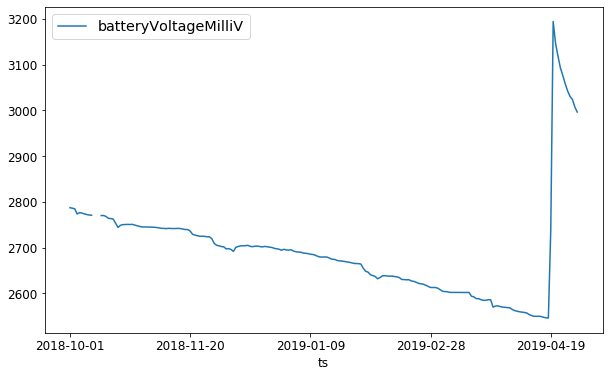

In [107]:
df = data[data.serialNo == 'VA4202760704']
df.plot('ts', 'batteryVoltageMilliV')

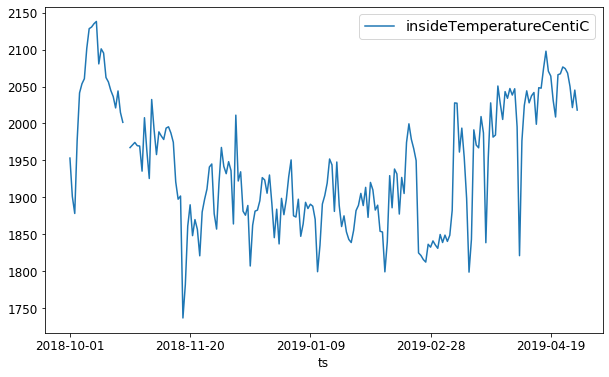

In [108]:
df.plot('ts', 'insideTemperatureCentiC')

In [109]:
df[df.batteryVoltageMilliV.isna()]

,ts,serialNo,home,batteryVoltageMilliV,insideTemperatureCentiC,humidityMilliPerc
10,2018-10-11,VA4202760704,165132,NaN,2135.1000,657.02356
11,2018-10-12,VA4202760704,165132,NaN,2138.1677,676.12256
12,2018-10-13,VA4202760704,165132,NaN,2080.6738,653.83685


In [110]:
df[df.insideTemperatureCentiC.isna()]

,ts,serialNo,home,batteryVoltageMilliV,insideTemperatureCentiC,humidityMilliPerc
23,2018-10-24,VA4202760704,165132,2750.4220,NaN,605.1256
24,2018-10-25,VA4202760704,165132,2750.6438,NaN,617.4750


In [111]:
df = data[data.serialNo == 'VA2170620672']
df.batteryVoltageMilliV.max()

3219.567

In [115]:
df.batteryVoltageMilliV.quantile(0.75)

2951.2801

In [127]:
#Для того же датчика выберите данные за ноябрь 2018 г. и укажите медианное значение на влажности (humidityMilliPerc).
df[(df.ts <='2018-11-31') & (df.ts >= '2018-11-01')].humidityMilliPerc.median()

566.3562

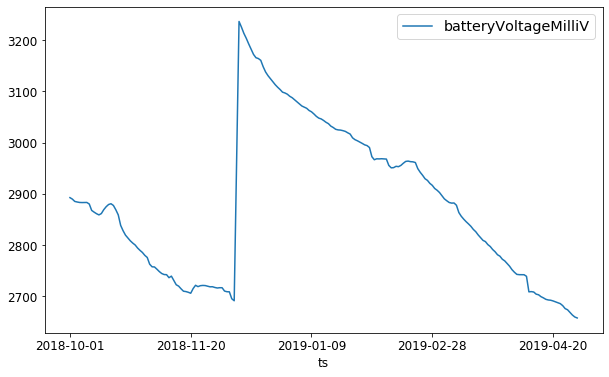

In [128]:
df = data[data.serialNo == 'VA2048854528']
df.plot('ts', 'batteryVoltageMilliV')

In [129]:
data[data.insideTemperatureCentiC < 1200].nunique()

ts                         23
serialNo                   11
home                        2
batteryVoltageMilliV       87
insideTemperatureCentiC    92
humidityMilliPerc          92
dtype: int64

In [141]:
qt75 = data.insideTemperatureCentiC.quantile(0.75)
print(qt75)
data[data['insideTemperatureCentiC'] >= qt75].insideTemperatureCentiC.nunique()

2147.1974499999997


1206

## 8.8 Интерполяция практика

In [143]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

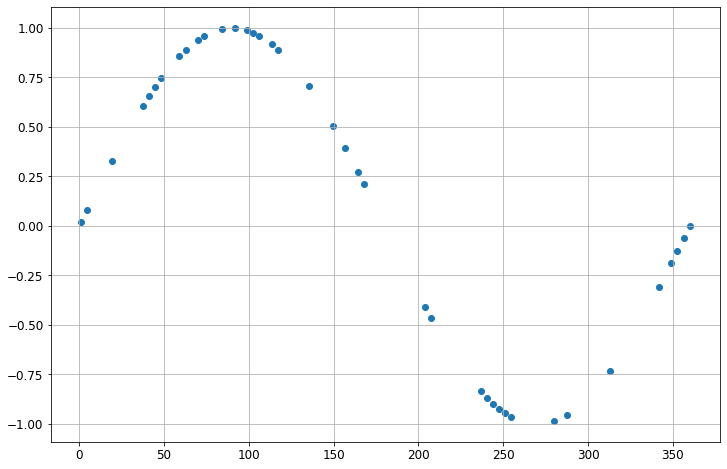

In [157]:
N = 100

df = pd.DataFrame()
## Создаем N точек по оси времени
df['t'] = np.linspace(1, 360, N)
df['y'] = np.sin(df.t * np.pi / 180)

np.random.seed(42)
# готовим точки, которые будут пропущены в выборке
missing = np.random.randint(low=1, high=100, size=100)
# убираем часть данных из выборки
df.loc[missing, 'y'] =np.nan


f, ax = plt.subplots(figsize = (12,8))
ax.scatter(df.t, df.y)
ax.grid()

In [162]:
df.isna().sum()

t     0
y    61
dtype: int64

In [161]:
df

,t,y
0,1.000000,1.745241e-02
1,4.626263,8.065581e-02
2,8.252525,NaN
3,11.878788,NaN
4,15.505051,NaN
...,...,...
95,345.494949,NaN
96,349.121212,-1.887319e-01
97,352.747475,-1.262427e-01
98,356.373737,-6.324798e-02


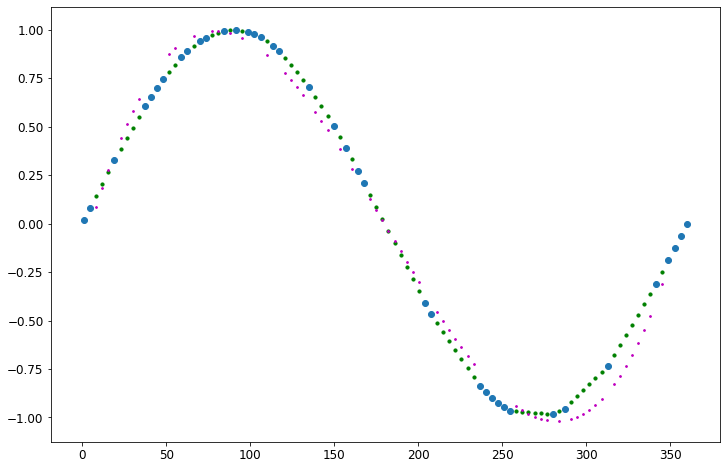

In [176]:
df['y_nearest'] = df['y'].interpolate(method='nearest')
df['y_linear'] = df['y'].interpolate(method='linear')
df['y_spline'] = df.y.interpolate(method='spline', order=3)
f, ax = plt.subplots(figsize=(12,8))
#ax.scatter(df.t, df.y_nearest, c='r')
ax.scatter(df.t, df.y_linear, c='g', s=10)
ax.scatter(df.t, df.y_spline, c='m', s=3)
ax.scatter(df.t, df.y)

# приведение к фиксированной сетке

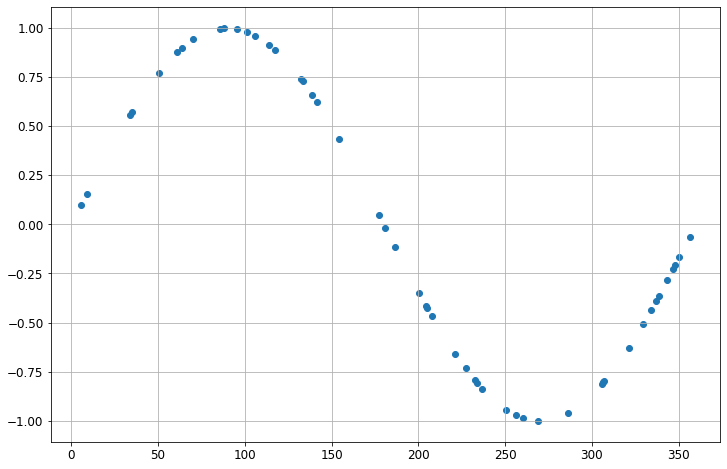

In [200]:
N = 360
df = pd.DataFrame()
df['t'] = N * np.random.rand(50)
df = df.sort_values(by='t')
df['y'] = np.sin(df.t * np.pi / 180)
f, ax = plt.subplots(figsize = (12,8))
ax.scatter(df.t, df.y)
ax.grid()

In [201]:
print(df.isna().sum())
df.shape

t    0
y    0
dtype: int64


(50, 2)

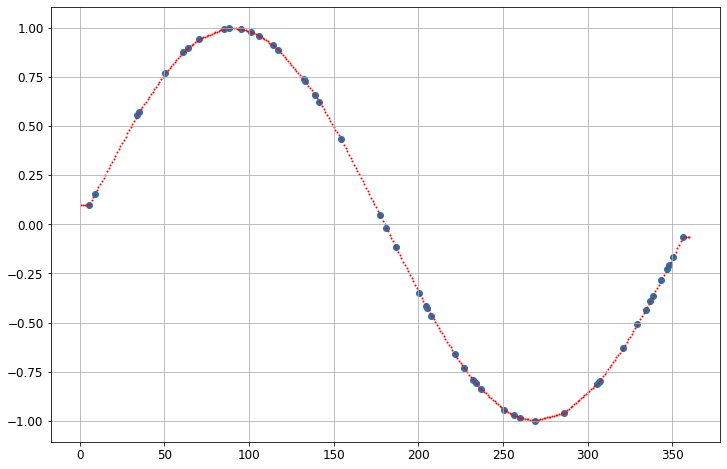

In [202]:
# создаем равномерную сетку
ti = np.linspace(1,N,N)
# new df
df_interp = pd.DataFrame()
df_interp['t'] = ti
df_interp['y'] = np.interp(ti, df.t, df.y)
f, ax = plt.subplots(figsize = (12,8))
ax.scatter(df.t, df.y)
ax.scatter(df_interp.t, df_interp.y, marker='.', c='r', s=4)
ax.grid()

## Задания

In [203]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from scipy import interpolate

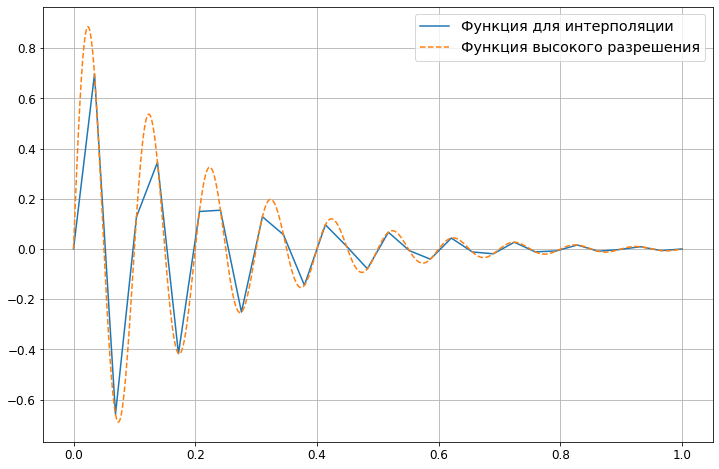

In [204]:
w1 = 10    
a1 = 1     
Fs = 30 
Ts = 1.0/Fs
alpha = 5

## исходная ось (низкое разрешение)
t = np.linspace(0, 1, Fs)
## функция для интерполяции
y = a1*np.exp(-alpha*t) * np.sin(2*np.pi*w1*t) 
 

## интерполяционная сетка (высокое разрешение)
tt = np.linspace(0, 1, 100*Fs)
## функция высокого разрешения (пытаемся получить её интерполяцией)
y_high_res = a1*np.exp(-alpha*tt) * np.sin(2*np.pi*w1*tt) 

f, ax = plt.subplots(figsize=(12, 8))
ax.plot(t, y)
ax.plot(tt, y_high_res, '--')
ax.legend(['Функция для интерполяции', 'Функция высокого разрешения'])
ax.grid()
plt.show()


##  Задание 8.8.1
0.0/2.0 points (graded)

Проинтерполируйте функцию "y" на сетке "tt" кубическим сплайном, используйте для этого interpolate.interp1d. Укажите среднее квадратическое отклонение интерполированной функции от функции высокого разрешения y_high_res по формуле
, округлите до 5 знака после точки.

In [215]:
len(tt)

3000

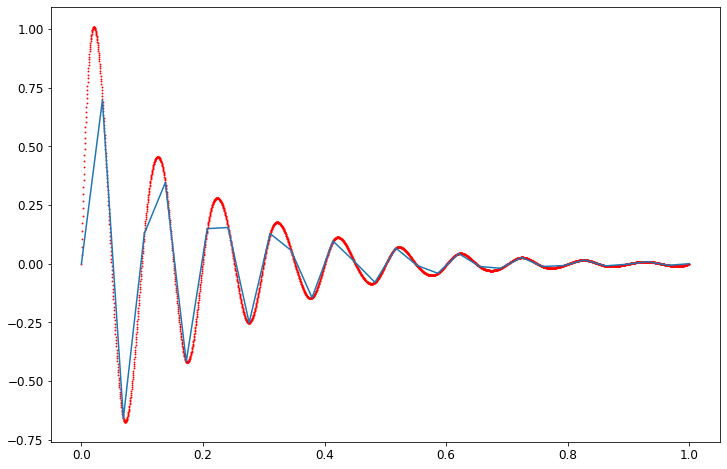

In [216]:
y_spline3 = np.interp(tt, t, y)
df = pd.DataFrame()
df['tt'] = tt

inter_func = interpolate.interp1d(t, y, kind = 'cubic')
df['y_spline3'] = inter_func(tt)
f, ax = plt.subplots(figsize=(12,8))
ax.plot(t, y)
ax.scatter(df.tt, df.y_spline3, marker='.', c='r', s=3)

In [217]:
from sklearn.metrics import mean_squared_error

In [218]:
mean_squared_error(df['y_spline3'], y_high_res)

0.0010529718919300142

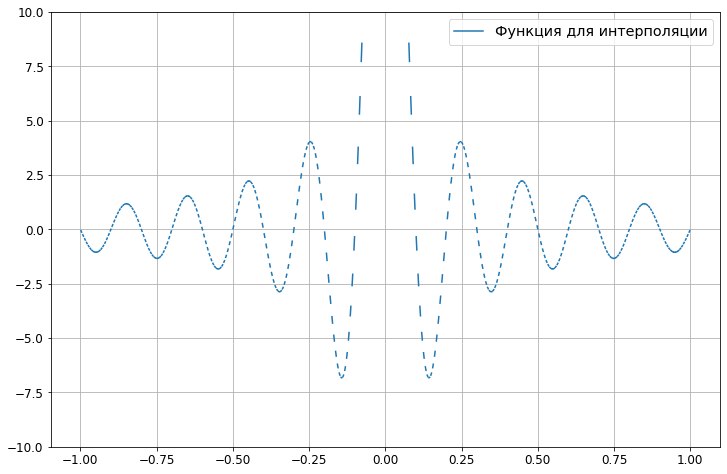

,t,y,y_lost
0,-1.000000,-1.224647e-15,NaN
1,-0.997998,-6.297937e-02,-0.062979
2,-0.995996,-1.259624e-01,-0.125962
3,-0.993994,-1.887000e-01,NaN
4,-0.991992,-2.509431e-01,-0.250943
5,-0.989990,-3.124436e-01,-0.312444
6,-0.987988,-3.729553e-01,NaN
7,-0.985986,-4.322350e-01,-0.432235
8,-0.983984,-4.900431e-01,-0.490043
9,-0.981982,-5.461451e-01,NaN


In [223]:
w1 = 5   
a1 = 1     
Fs = 1000
Ts = 1.0/Fs
alpha = 5

df = pd.DataFrame()
## ось
df['t'] = np.linspace(-1, 1, Fs)
## функция для интерполяции
df['y'] = np.sin(2*np.pi*w1*df.t) / df.t 
 
## пропущенные значения    
df['y_lost'] = df.y
df.loc[0::3, 'y_lost'] = np.nan


f, ax = plt.subplots(figsize=(12, 8))
ax.plot(df.t, df.y_lost)
ax.set_ylim([-10, 10])
ax.legend(['Функция для интерполяции'])
ax.grid()
plt.show()

df.head(10)

In [232]:
df['y_nearest'] = df['y_lost'].interpolate(method='nearest')
df.tail(10)

,t,y,y_lost,y_nearest
990,0.981982,-5.461451e-01,NaN,-0.600312
991,0.983984,-4.900431e-01,-0.490043,-0.490043
992,0.985986,-4.322350e-01,-0.432235,-0.432235
993,0.987988,-3.729553e-01,NaN,-0.432235
994,0.989990,-3.124436e-01,-0.312444,-0.312444
995,0.991992,-2.509431e-01,-0.250943,-0.250943
996,0.993994,-1.887000e-01,NaN,-0.250943
997,0.995996,-1.259624e-01,-0.125962,-0.125962
998,0.997998,-6.297937e-02,-0.062979,-0.062979
999,1.000000,-1.224647e-15,NaN,NaN


In [235]:
df['y_pol5'] = df['y_lost'].interpolate(method='polynomial', order = 5)


In [236]:
mean_squared_error(df['y_pol5'][1:-1], df.y[1:-1])

1.3462275866615986e-18

## 8.9 Изменение разрешения - практика

In [293]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

In [294]:
df = pd.read_csv('data/gold_clean.csv')
df['ts'] = pd.to_datetime(df['ts'])

In [295]:
df = df.iloc[:1440]

In [296]:
df.head(6)

,ts,open,high,low,close,vol
0,2018-01-02 02:01:00,1305.3,1305.9,1304.6,1304.7,407
1,2018-01-02 02:02:00,1304.7,1305.1,1304.7,1305.0,91
2,2018-01-02 02:03:00,1305.0,1305.4,1305.0,1305.4,42
3,2018-01-02 02:04:00,1305.4,1305.5,1305.1,1305.2,89
4,2018-01-02 02:05:00,1305.2,1305.2,1305.1,1305.1,23
5,2018-01-02 02:06:00,1305.1,1305.1,1304.9,1304.9,25


In [297]:
## своя функция аггрегации - возвращаем наименьшее значение
def myFunc(value):
    return min(value)

## определяем, как аггрегировать данные в колонках
conversion = {
    'open' : 'first',
    'high' : 'max',
    'low' : myFunc,
    'close' : 'mean',
    'vol' : 'sum'
}

df = df.set_index('ts')

In [298]:
downsampled = df.resample('2H').apply(conversion)

In [299]:
df = df.reset_index()
df

,ts,open,high,low,close,vol
0,2018-01-02 02:01:00,1305.3,1305.9,1304.6,1304.7,407
1,2018-01-02 02:02:00,1304.7,1305.1,1304.7,1305.0,91
2,2018-01-02 02:03:00,1305.0,1305.4,1305.0,1305.4,42
3,2018-01-02 02:04:00,1305.4,1305.5,1305.1,1305.2,89
4,2018-01-02 02:05:00,1305.2,1305.2,1305.1,1305.1,23
...,...,...,...,...,...,...
1435,2018-01-03 02:57:00,1321.7,1321.8,1321.7,1321.8,54
1436,2018-01-03 02:58:00,1321.8,1321.9,1321.7,1321.9,74
1437,2018-01-03 02:59:00,1321.9,1321.9,1321.8,1321.8,33
1438,2018-01-03 03:00:00,1321.9,1321.9,1321.7,1321.8,50


In [300]:
downsampled = downsampled.reset_index()

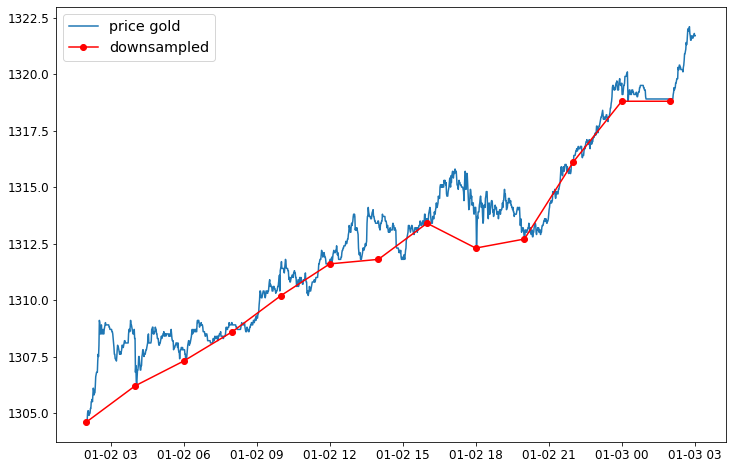

In [301]:
# визуализируем
f, ax = plt.subplots(figsize = (12,8))
ax.plot(df.ts, df.low)
ax.plot(downsampled.ts, downsampled.low, c='r',  marker='o')
ax.legend(['price gold', 'downsampled'])

In [302]:
df.shape

(1440, 6)

In [303]:
downsampled.shape

(13, 6)

## Upsampling

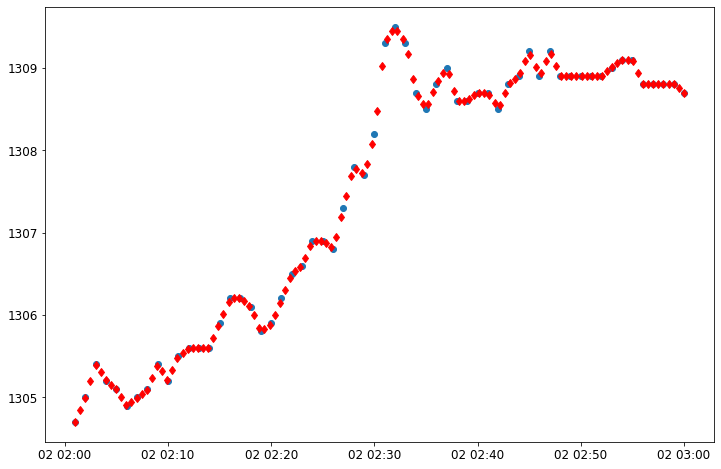

In [308]:
df = pd.read_csv('data/gold_clean.csv')
df['unixtime'] = df.ts
df['ts'] = pd.to_datetime(df['ts'])
df = df.iloc[:60]

## cделаем интерполяционную сетку, 120 значений (каждые 30 секунд)
## np.interp не умеет работать с таймстемпами, поэтому будем использовать
## юниксовое время, являющееся просто int
ti = np.linspace(df.unixtime.min(), df.unixtime.max(), 120)

# интерполируем
upsampled = np.interp(ti, df.unixtime, df.close)
ts = pd.to_datetime(ti)

f, ax = plt.subplots(figsize = (12,8))
ax.plot(df.ts, df.close, lw=0, marker = 'o')
ax.plot(ts, upsampled, c='r', marker='d', lw=0)

## Задания

In [309]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import time, datetime

In [310]:
filePath = 'EURUSD_1.csv'
data = pd.read_csv(filePath)
data['ts'] = pd.to_datetime(data.ts)
print(f'data.shape = {data.shape}')

data.head()

data.shape = (121674, 6)


,open,high,low,close,vol,ts
0,1.05135,1.05192,1.05134,1.05187,65,2017-01-02 09:00:00
1,1.05185,1.05198,1.05153,1.05168,58,2017-01-02 09:01:00
2,1.05175,1.05201,1.05149,1.05154,33,2017-01-02 09:02:00
3,1.05177,1.05202,1.05177,1.05200,20,2017-01-02 09:03:00
4,1.05202,1.05202,1.05198,1.05202,7,2017-01-02 09:04:00


In [313]:
df = data.copy()
df = df[df.ts < '2017-02-02']

fig = go.Figure(data  = [go.Candlestick(
            x=df['ts'],
            open  = df['open'],
            high  = df['high'],
            low   = df['low'],
            close = df['close']
        )])

fig.show()

In [ ]:
d